## Camera Calibation

In order to compute the camera calibration matrix and distortion coefficients given a set of chessboard images, OpenCV provides the function "calibrateCamera" (line 38) and returns the calibration matrix, distortion matrix as well as rotation and translation vectrs. It needs though a set of object points and imagepoints. The objectpoints are 3D vectors which represent the calibration pattern points in the calibration pattern coordinate space where in our case  all the vectors are the same. The imagepoints represent the corners on the chessboard. Those corner are found by the "findChessboardCorners" (lne 28) from OpenCV which takes the number of inner corners per chessboard row and column. The image has to be grayscale (line 25). The defined "calibrate_function" is used as an calibration step later in the pipeline or in this case for outputting the results of the chessboards.

In [1]:
#load necessary libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

%matplotlib inline

In [2]:
def calibrate_camera(file_path, nx = 9, ny = 6, output = False):
    
    #Read in the images
    # prepare object points
    nx = 9 
    ny = 6
    imgpoints = []
    objpoints = []
    imgs = []
    undsts = []

    objpts = np.zeros((nx*ny,3),np.float32)
    objpts[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    # Make a list of calibration images
    files = glob.glob(file_path+'/*.jpg')

    for file in files:
        #open the image
        img = cv2.imread(file)
    
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # If found, draw corners
        if ret == True:
            # add corners and pbjectpoints to the list
            imgpoints.append(corners)
            objpoints.append(objpts)
            # add the image for later processing, not all returned corners...
            imgs.append(img)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[:2], None, None)

    # show the pictures, if output true
    if output:
        #create new figure
        plt.figure()
        f, ax = plt.subplots(len(imgs),2,figsize=(20,100))

        for i in range(len(imgs)):
            ax[i,0].imshow(imgs[i])
            ax[i,0].set_title('Original Chessboard', fontsize=30)
            ax[i,1].imshow(cv2.undistort(imgs[i], mtx, dist, None, mtx))
            ax[i,1].set_title('Undistorted Chessboard', fontsize=30)
    
    return ret, mtx, dist, rvecs, tvecs

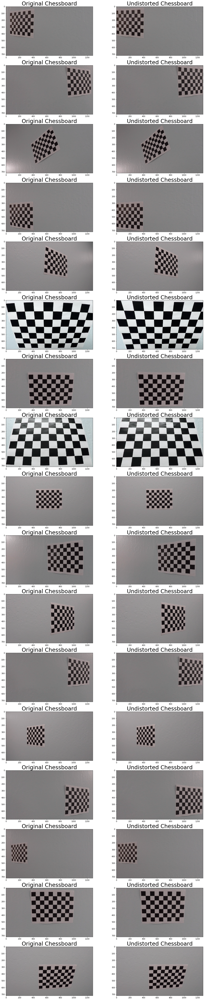

In [3]:
ret, mtx, dist, rvecs, tvecs = calibrate_camera('camera_cal/', output = True)

# Implementation of the pipeline

#### Example of distortion corrected image
In this part an image from the "test_images" folder is taken as an example to show the correction by the undistort function from the CV2 library(line 3). That function uses the parameter provided by the camera calibration part above. To better see the effect, first the whole picture and then the right side of each image was displayed(line 6-13).

In [4]:
def create_undistort_image(image, ret, mtx, dist):
    return cv2.undistort(image, mtx, dist, None, mtx)

def select_yellow_area(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    lower = np.array([20, 60, 60])
    upper = np.array([38,174,250])
    
    mask = cv2.inRange(hsv, lower, upper)
    
    return mask

def select_yellow_area_cb(image):
    ycrcb = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    lower = np.array([0, 0, 0])
    upper = np.array([255,255,100])
    
    mask = cv2.inRange(ycrcb, lower, upper)
    
    return mask

def select_white_area(image):
    lower = np.array([202, 202, 202])
    upper = np.array([255,255,255])
    
    mask = cv2.inRange(image, lower, upper)
    
    return mask


/home/alex/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


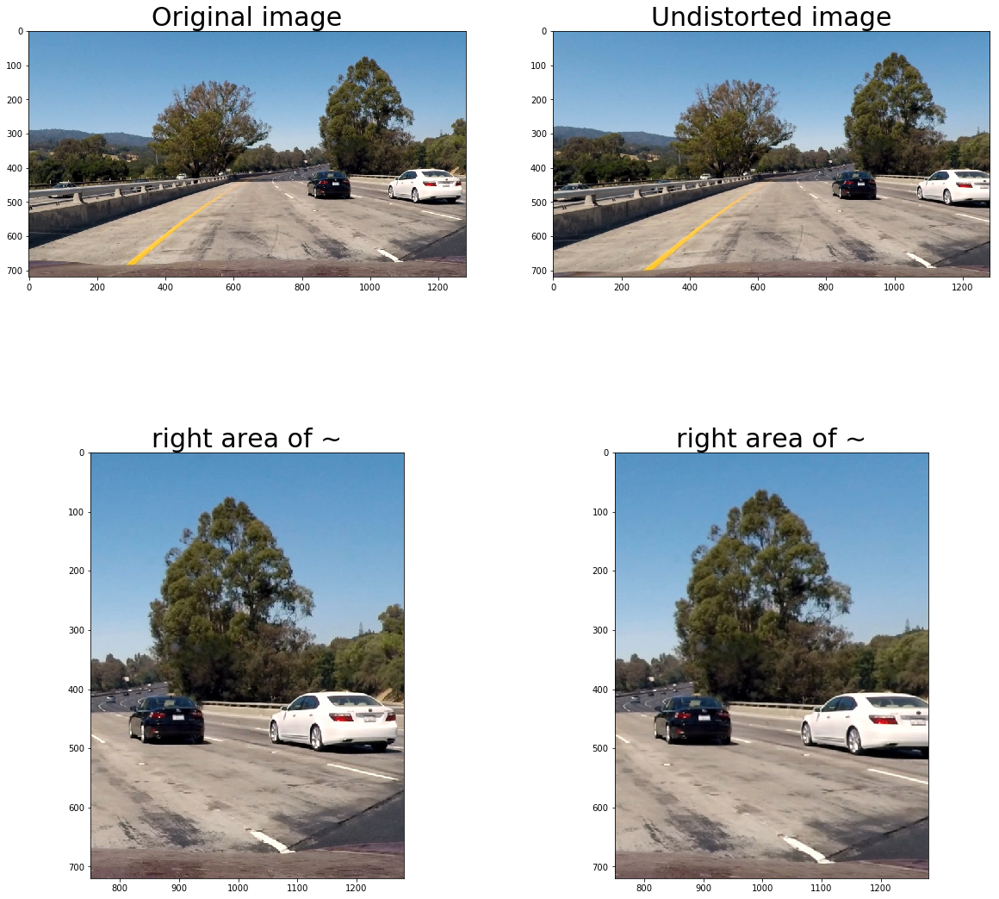

In [5]:
original_img = plt.imread('test_images/test1.jpg')
udst = create_undistort_image(original_img, ret, mtx, dist)
plt.figure()
#create figure and axes object
f, ax = plt.subplots(2,2,figsize = (20,20))
#show images and areas
ax[0,0].imshow(original_img)
ax[0,1].imshow(udst)
ax[1,0].imshow(original_img)
ax[1,1].imshow(udst)
ax[1,0].set_xlim(750,original_img.shape[1])
ax[1,1].set_xlim(750,udst.shape[1])
#set titles...
ax[0,0].set_title('Original image', fontsize=30)
ax[0,1].set_title('Undistorted image', fontsize=30)
ax[1,0].set_title('right area of ~', fontsize=30)
ax[1,1].set_title('right area of ~', fontsize=30)

f.tight_layout
f.show()

## Creating a threshold binary picture
In order to create a threshold binary picture, the sobel operator was used take the gradient of the testimage. The Kernel size was varied between 3 (sharp) and 29 (smooth) edges. The gradiend in the x-direction recognizes vertical lines better than horizontal lines, the magnitude therefore combines the two but with more noise like mountains or bridges which might make result in wrong or noisy detected lanes. The directions seems just like a lot of noise. In order to find a good combination and to reason which combination was chose, some colorspaces and thresholds are shown in the following passage.
During that part several helper functions were created:
* create_sobel_binary_images - returns the grayscale gradient in x-, y-direction as well as the magnitude and directions of the gradient, each has a threshold given as input of the function
* create_sobel_n_binary_images -  returns the x-gradient where n stands for the n-th space of the input image
* create_gray_binary_image - returns the binary image based on grayscale image, although input is RGB and a threshold
* create_RGB_binary_images - returns three binary images, one for each space in the RGB color space, inputs are RGB and a threshold for each space
* create_HLS_binary_images - returns three binary images, one for each space in the HLS color space, inputs are HLS and a threshold for each space
* create_YUV_binary_images - returns three binary images, one for each space in the YUV color space, inputs are YUV and a threshold for each space
* create_LAB_binary_images - returns three binary images, one for each space in the LAB color space, inputs are LAB and a threshold for each space

Sobel gradient images are created with the cv2 "Sobel" function (ex. line 6). It takes the image, which direction and the kernel size as input. Further on the absolute value (no negative color values, ex. line 10) is calculated as well as scaling. The scaling of the color values from 0-255 ensures that the threshold is always valid ((ex. line 17). The final step iss to create a black mask same size as the input image (ex. line 22) and set all values of the mask which are within the chosen threshold to "1" (ex. line 74)

In [6]:
 def create_sobel_binary_images( image, sobel_kernel = 5, xthresh = (20,100),ythresh = (20,100),mthresh = (20,100), angle = (0, np.pi/2)):
    # convert to grayscale, assumed its an RGB image
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # calculate sobel
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # calculate the absolute value
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    abs_sobel = np.sqrt(abs_sobelx*abs_sobelx+abs_sobely*abs_sobely)
    sobel_direction = np.arctan2(sobely,sobelx)

    
    #scale it from 0-255 to ensure the input threshold does its job
    scaledx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    scaledy = np.uint8(255*abs_sobely/np.max(abs_sobely))
    scaled = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    #create 0-filled arrays sames size the scaled matrices
    sxbinary = np.zeros_like(scaledx)
    sybinary = np.zeros_like(scaledy)
    sbinary = np.zeros_like(scaled)
    dirbinary = np.zeros_like(sobel_direction)
    
    #get the thresholds
    xthresh_min = xthresh[0]
    xthresh_max = xthresh[1]
    
    ythresh_min = ythresh[0]
    ythresh_max = ythresh[1]
    
    mthresh_min = mthresh[0]
    mthresh_max = mthresh[1]
    
    angle_min = angle[0]
    angle_max = angle[1]    
    
    #set 1 where the threshold range is met
    sxbinary[(scaledx >= xthresh_min) & (scaledx <= xthresh_max)] = 1
    sybinary[(scaledy >= ythresh_min) & (scaledy <= ythresh_max)] = 1
    sbinary[(scaled >= mthresh_min) & (scaled <= mthresh_max)] = 1
    dirbinary[(sobel_direction >= angle_min) & (sobel_direction <= angle_max)] = 1
        
    return sxbinary, sybinary, sbinary, dirbinary

def create_sobel_n_binary_images( image, sobel_kernel = 5, xthresh = (20,100), n = 0 ):
    
    # calculate sobel
    sobelx = cv2.Sobel(image[:,:,n], cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(image[:,:,n], cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    # calculate the absolute value
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    abs_sobel = np.sqrt(abs_sobelx**2+abs_sobely**2)
    
    #scale it from 0-255 to ensure the input threshold does its job
    scaledx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    scaledy = np.uint8(255*abs_sobely/np.max(abs_sobely))
    scaled = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    #create 0-filled arrays sames size the scaled matrices
    sxbinary = np.zeros_like(scaledx)
    sbinary = np.zeros_like(scaled)
    
    #get the thresholds
    xthresh_min = xthresh[0]
    xthresh_max = xthresh[1]
    
    #set 1 where the threshold range is met
    sxbinary[(scaledx >= xthresh_min) & (scaledx <= xthresh_max)] = 1
    sbinary[(scaled >= xthresh_min) & (scaled <= xthresh_max)] = 1
        
    return sxbinary

def create_gray_binary_image(image, thresh = (20, 100)):
    #seperate each channel
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    
    graybinary = np.zeros_like(gray)

    thresh_min = thresh[0]
    thresh_max = thresh[1]
    
    graybinary[(gray > thresh_min) & (gray <= thresh_max)] = 1
    
    return graybinary


def create_RGB_binary_images(image, rthresh = (20, 100), gthresh = (20, 100), bthresh = (20, 100)):
    #seperate each channel
    R = image[:,:,0]
    G = image[:,:,1]
    B = image[:,:,2]
    
    rbinary = np.zeros_like(R)
    gbinary = np.zeros_like(G)
    bbinary = np.zeros_like(B)
    
    rbinary[(R > rthresh[0]) & (R <= rthresh[1])] = 1
    gbinary[(G > gthresh[0]) & (G <= gthresh[1])] = 1
    bbinary[(B > bthresh[0]) & (B <= bthresh[1])] = 1
    
    return rbinary,gbinary,bbinary

def create_HLS_binary_images(image, hthresh = (20, 100), lthresh = (20, 100), sthresh = (120, 255)):
    #convert to HLS, assuming we got RGB
    HLS = cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    
    #seperate each channel
    H = HLS[:,:,0]
    L = HLS[:,:,1]
    S = HLS[:,:,2]
    
    hbinary = np.zeros_like(H)
    lbinary = np.zeros_like(L)
    sbinary = np.zeros_like(S)
    
    hbinary[(H > hthresh[0]) & (H <= hthresh[1])] = 1
    lbinary[(L > lthresh[0]) & (L <= lthresh[1])] = 1
    sbinary[(S > sthresh[0]) & (S <= sthresh[1])] = 1
    
    return hbinary,lbinary,sbinary

def create_YUV_binary_images(image, ythresh = (20, 100), uthresh = (20, 100), vthresh = (20, 100)):
    #convert to YUV, assuming we got RGB
    YUV = cv2.cvtColor(image,cv2.COLOR_RGB2YUV)
    
    #seperate each channel
    Y = YUV[:,:,0]
    U = YUV[:,:,1]
    V = YUV[:,:,2]
    
    ybinary = np.zeros_like(Y)
    ubinary = np.zeros_like(U)
    vbinary = np.zeros_like(V)
    
    ybinary[(Y > ythresh[0]) & (Y <= ythresh[1])] = 1
    ubinary[(U > uthresh[0]) & (U <= uthresh[1])] = 1
    vbinary[(V > vthresh[0]) & (V <= vthresh[1])] = 1
    
    return ybinary,ubinary,vbinary

def create_LAB_binary_images(image, Lthresh = (20, 100), Athresh = (20, 100), Bthresh = (20, 100)):
    #convert to LAB, assuming we got RGB
    LAB = cv2.cvtColor(image,cv2.COLOR_RGB2LAB)
    
    #seperate each channel
    L = LAB[:,:,0]
    A = LAB[:,:,1]
    B = LAB[:,:,2]
    
    lbinary = np.zeros_like(L)
    abinary = np.zeros_like(A)
    bbinary = np.zeros_like(B)
    
    lbinary[(L > Lthresh[0]) & (L <= Lthresh[1])] = 1
    abinary[(A > Athresh[0]) & (A <= Athresh[1])] = 1
    bbinary[(B > Bthresh[0]) & (B <= Bthresh[1])] = 1
    
    return lbinary,abinary,bbinary

### Analysing Sobel
The sobel images show pretty well where the color values are changing. This might be an issue if there is noise in the picture or if the road is dirty or has structures (like sidewalks). The x-gradient shows the lanes very good but not well enough for single use.

/home/alex/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


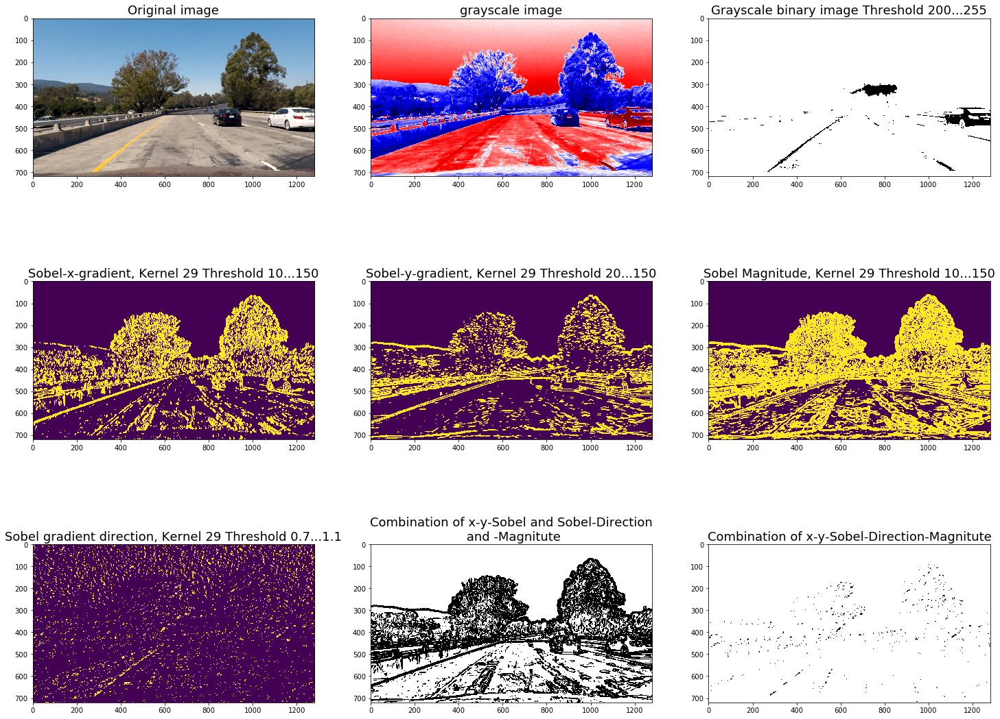

In [7]:
skernel = 29                     # Kernel Size for sobel
xsobel_thresh = (10,150)        # X Threshold for sobel
ysobel_thresh = (20,150)        # Y Threshold for sobel
msobel_thresh = (10,150)        # Magnitude Threshold for sobel
dsobel_thresh = (0.7,1.1)       # Threshold for sobel angle
grthresh = (200,255)             # Threshold for Grayscale
title_font_size = 18
gr_binary_img = create_gray_binary_image(udst, grthresh)



binary_imgs = create_sobel_binary_images(udst, skernel, xsobel_thresh,ysobel_thresh, msobel_thresh, dsobel_thresh)
gradxy_md_combination = np.zeros_like(binary_imgs[0])
gradxy_md_combination[((binary_imgs[0] == 1 ) | (binary_imgs[1] == 1)) | ((binary_imgs[2] == 1) & (binary_imgs[3] == 1))] = 1

f, ax = plt.subplots(3,3,figsize = (25,20))

ax[0,0].imshow(udst)
ax[0,0].set_title('Original image', fontsize=title_font_size)

ax[0,1].imshow(cv2.cvtColor(udst,cv2.COLOR_RGB2GRAY), cmap = 'seismic')
ax[0,1].set_title('grayscale image', fontsize=title_font_size)

ax[0,2].imshow(gr_binary_img, cmap = 'binary')
ax[0,2].set_title('Grayscale binary image Threshold '+str(grthresh[0])+'...'+str(grthresh[1]), fontsize=title_font_size)

ax[1,0].imshow(binary_imgs[0])
ax[1,0].set_title('Sobel-x-gradient, Kernel '+str(skernel)+' Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)

ax[1,1].imshow(binary_imgs[1])
ax[1,1].set_title('Sobel-y-gradient, Kernel '+str(skernel)+' Threshold '+str(ysobel_thresh[0])+'...'+str(ysobel_thresh[1]), fontsize=title_font_size)

ax[1,2].imshow(binary_imgs[2])
ax[1,2].set_title('Sobel Magnitude, Kernel '+str(skernel)+' Threshold '+str(msobel_thresh[0])+'...'+str(msobel_thresh[1]), fontsize=title_font_size)

ax[2,0].imshow(binary_imgs[3])
ax[2,0].set_title('Sobel gradient direction, Kernel '+str(skernel)+' Threshold '+str(dsobel_thresh[0])+'...'+str(dsobel_thresh[1]), fontsize=title_font_size)


ax[2,1].imshow(gradxy_md_combination, cmap = 'binary')
ax[2,1].set_title('Combination of x-y-Sobel and Sobel-Direction\n and -Magnitute', fontsize=title_font_size)

combined2 = np.zeros_like(binary_imgs[0])
combined2[(binary_imgs[0] == 1 ) & (binary_imgs[1] == 1) & (binary_imgs[2] == 1) & (binary_imgs[3] == 1)] = 1
ax[2,2].imshow(combined2, cmap = 'binary')
ax[2,2].set_title('Combination of x-y-Sobel-Direction-Magnitute', fontsize=title_font_size)

f.show()

plt.figure()

### Analysing different color spaces and the effect of the sobel operator - RGB
In the RGB color space, the R-Channel shows the left lane very well with little noise arund it. In combination with the x-gradient it reduces the noise along the left lane.

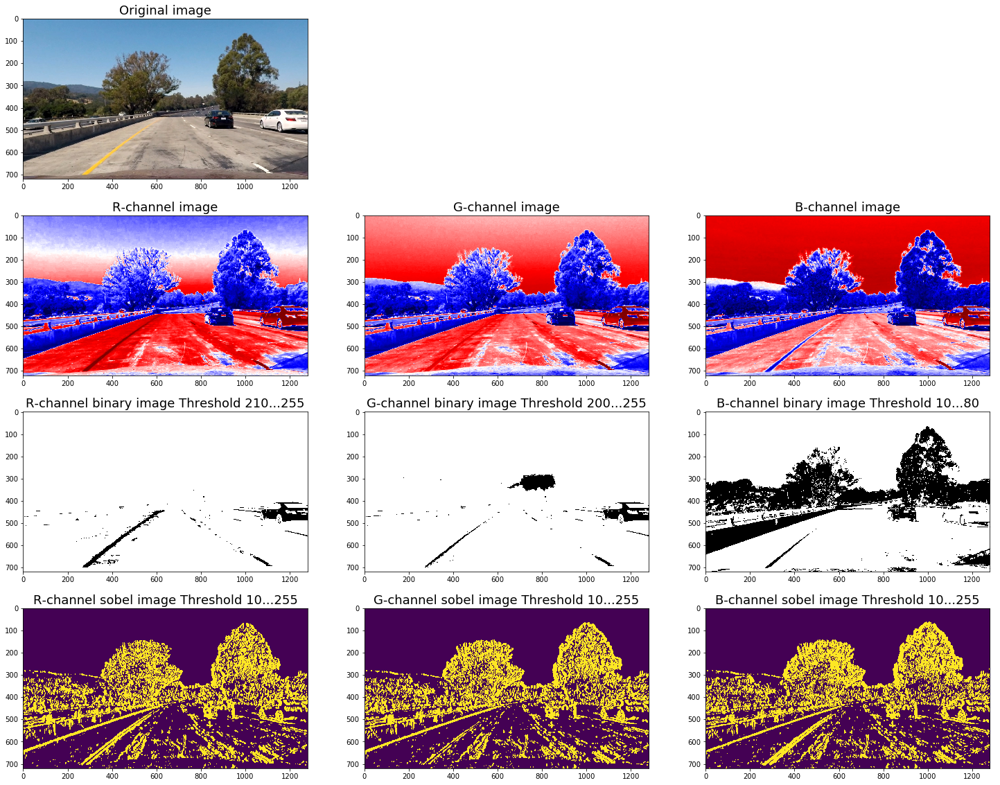

In [8]:
rthresh = (210,255)             # Threshold for R-Channel
gthresh = (200,255)             # Threshold for G-Channel
bthresh = (10,80)               # Threshold for B-Channel

skernel = 29                     # Kernel Size for sobel
xsobel_thresh = (10,255)        # X Threshold for sobel

rgb_binary_imgs = create_RGB_binary_images(udst, rthresh, gthresh, bthresh)

f, axc = plt.subplots(4,3,figsize = (25,20))


axc[0,0].imshow(udst)
axc[0,0].set_title('Original image', fontsize=title_font_size)

axc[0,1].set_axis_off()
axc[0,2].set_axis_off()


axc[1,0].imshow(udst[:,:,0], cmap = 'seismic')
axc[1,0].set_title('R-channel image', fontsize=title_font_size)

axc[1,1].imshow(udst[:,:,1], cmap = 'seismic')
axc[1,1].set_title('G-channel image', fontsize=title_font_size)

axc[1,2].imshow(udst[:,:,2], cmap = 'seismic')
axc[1,2].set_title('B-channel image', fontsize=title_font_size)


axc[2,0].imshow(rgb_binary_imgs[0], cmap = 'binary')
axc[2,0].set_title('R-channel binary image Threshold '+str(rthresh[0])+'...'+str(rthresh[1]), fontsize=title_font_size)

axc[2,1].imshow(rgb_binary_imgs[1], cmap = 'binary')
axc[2,1].set_title('G-channel binary image Threshold '+str(gthresh[0])+'...'+str(gthresh[1]), fontsize=title_font_size)

axc[2,2].imshow(rgb_binary_imgs[2], cmap = 'binary')
axc[2,2].set_title('B-channel binary image Threshold '+str(bthresh[0])+'...'+str(bthresh[1]), fontsize=title_font_size)

axc[3,0].imshow(create_sobel_n_binary_images(udst, n=0, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,0].set_title('R-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)

axc[3,1].imshow(create_sobel_n_binary_images(udst, n=1, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,1].set_title('G-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)

axc[3,2].imshow(create_sobel_n_binary_images(udst, n=2, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,2].set_title('B-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)


### Analysing different color spaces and the effect of the sobel operator - HLS
In the HLS color space, the S-channel performs very good. It seems it's even good enough to solely use it for the lane finding pipeline. Although the combination with x-gradient make the image seem worse, it was suggested in the lectures...

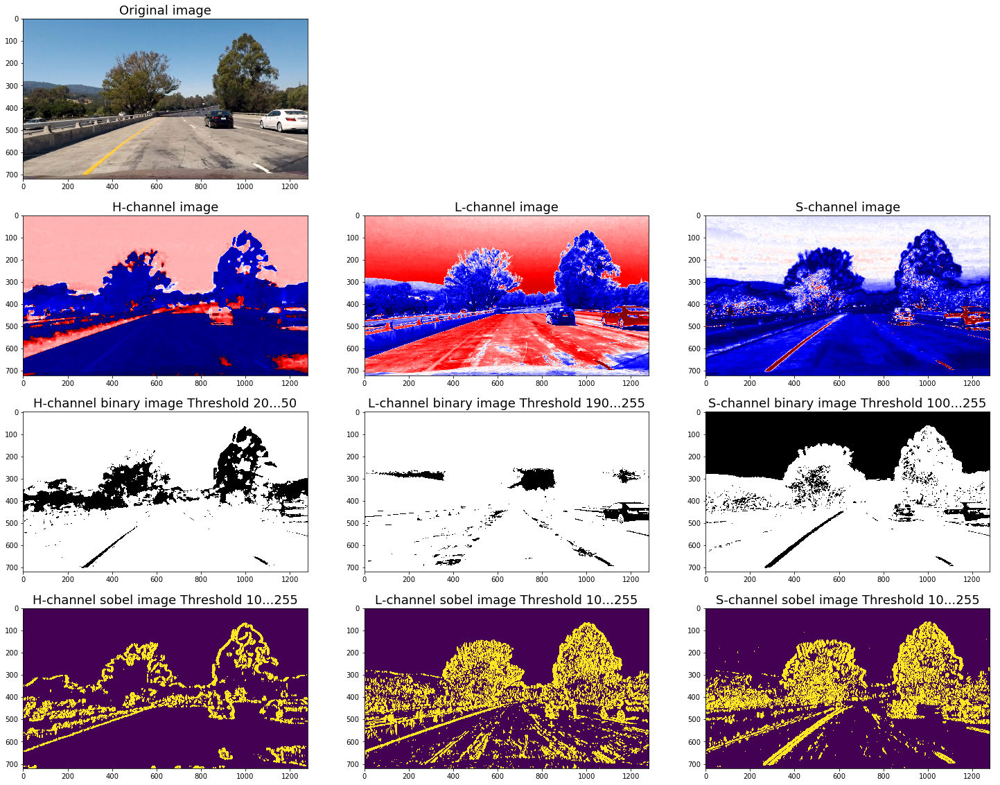

In [9]:

hthresh = (20,50)               # Threshold for H-Channel
lthresh = (190,255)             # Threshold for L-Channel
sthresh = (100,255)             # Threshold for S-Channel

hls_binary_imgs = create_HLS_binary_images(udst, hthresh, lthresh, sthresh)
hls_img = cv2.cvtColor(udst,cv2.COLOR_RGB2HLS)

f, axc = plt.subplots(4,3,figsize = (25,20))

axc[0,0].imshow(udst)
axc[0,0].set_title('Original image', fontsize=title_font_size)

axc[0,1].set_axis_off()
axc[0,2].set_axis_off()

axc[1,0].imshow(hls_img[:,:,0], cmap = 'seismic')
axc[1,0].set_title('H-channel image', fontsize=title_font_size)

axc[1,1].imshow(hls_img[:,:,1], cmap = 'seismic')
axc[1,1].set_title('L-channel image', fontsize=title_font_size)

axc[1,2].imshow(hls_img[:,:,2], cmap = 'seismic')
axc[1,2].set_title('S-channel image', fontsize=title_font_size)


axc[2,0].imshow(hls_binary_imgs[0], cmap = 'binary')
axc[2,0].set_title('H-channel binary image Threshold '+str(hthresh[0])+'...'+str(hthresh[1]), fontsize=title_font_size)

axc[2,1].imshow(hls_binary_imgs[1], cmap = 'binary')
axc[2,1].set_title('L-channel binary image Threshold '+str(lthresh[0])+'...'+str(lthresh[1]), fontsize=title_font_size)

axc[2,2].imshow(hls_binary_imgs[2], cmap = 'binary')
axc[2,2].set_title('S-channel binary image Threshold '+str(sthresh[0])+'...'+str(sthresh[1]), fontsize=title_font_size)

axc[3,0].imshow(create_sobel_n_binary_images(hls_img, n=0, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,0].set_title('H-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)

axc[3,1].imshow(create_sobel_n_binary_images(hls_img, n=1, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,1].set_title('L-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)

axc[3,2].imshow(create_sobel_n_binary_images(hls_img, n=2, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,2].set_title('S-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)


### Analysing different color spaces and the effect of the sobel operator - YUV
In the YUV color space, the Y channel shows the right white lane very good. Again the x-gradient seems to only add more noise.

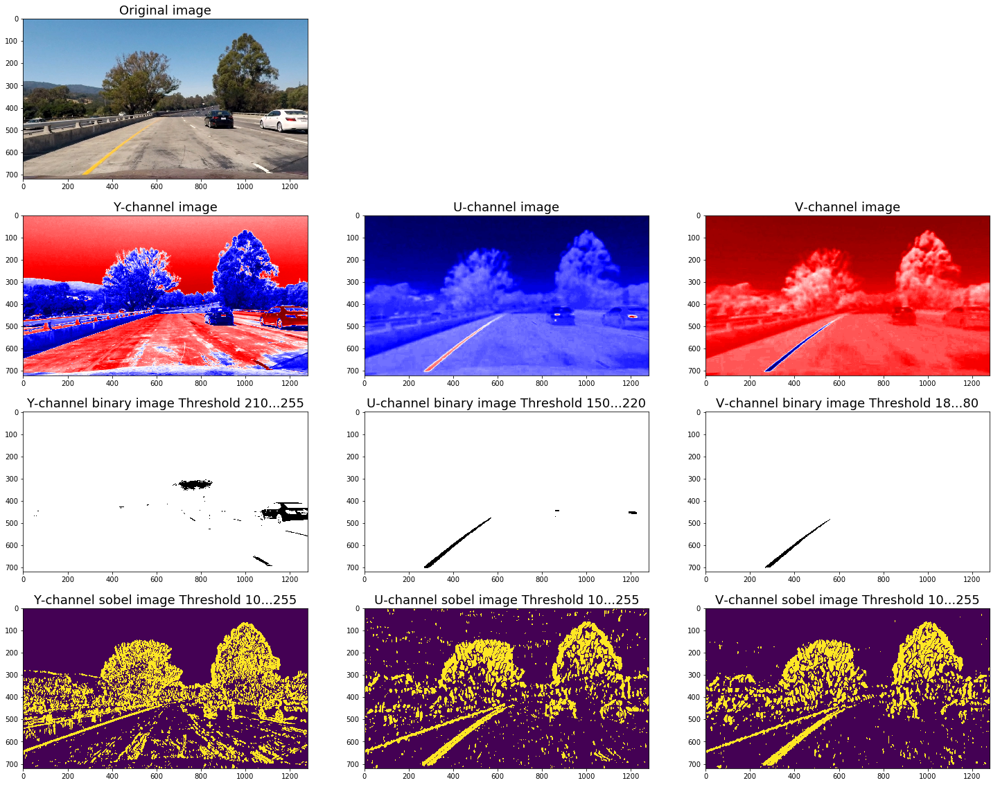

In [10]:

ythresh = (210,255)             # Threshold for Y-Channel
uthresh = (150,220)             # Threshold for U-Channel
vthresh = (18,80)               # Threshold for V-Channel

yuv_binary_imgs = create_YUV_binary_images(udst, ythresh, uthresh, vthresh)
yuv_img = cv2.cvtColor(udst,cv2.COLOR_RGB2YUV)

f, axc = plt.subplots(4,3,figsize = (25,20))

axc[0,0].imshow(udst)
axc[0,0].set_title('Original image', fontsize=title_font_size)

axc[0,1].set_axis_off()
axc[0,2].set_axis_off()

axc[1,0].imshow(yuv_img[:,:,0], cmap = 'seismic')
axc[1,0].set_title('Y-channel image', fontsize=title_font_size)

axc[1,1].imshow(yuv_img[:,:,1], cmap = 'seismic')
axc[1,1].set_title('U-channel image', fontsize=title_font_size)

axc[1,2].imshow(yuv_img[:,:,2], cmap = 'seismic')
axc[1,2].set_title('V-channel image', fontsize=title_font_size)

axc[2,0].imshow(yuv_binary_imgs[0], cmap = 'binary')
axc[2,0].set_title('Y-channel binary image Threshold '+str(ythresh[0])+'...'+str(ythresh[1]), fontsize=title_font_size)

axc[2,1].imshow(yuv_binary_imgs[1], cmap = 'binary')
axc[2,1].set_title('U-channel binary image Threshold '+str(uthresh[0])+'...'+str(uthresh[1]), fontsize=title_font_size)

axc[2,2].imshow(yuv_binary_imgs[2], cmap = 'binary')
axc[2,2].set_title('V-channel binary image Threshold '+str(vthresh[0])+'...'+str(vthresh[1]), fontsize=title_font_size)

axc[3,0].imshow(create_sobel_n_binary_images(yuv_img, n=0, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,0].set_title('Y-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)

axc[3,1].imshow(create_sobel_n_binary_images(yuv_img, n=1, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,1].set_title('U-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)

axc[3,2].imshow(create_sobel_n_binary_images(yuv_img, n=2, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,2].set_title('V-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)



### Analysing different color spaces and the effect of the sobel operator - LAB
In the LAB color space, the L-channel shows similar quality like the S-channel in HLS color space. And here the x-gradient just seems to lower the quality.

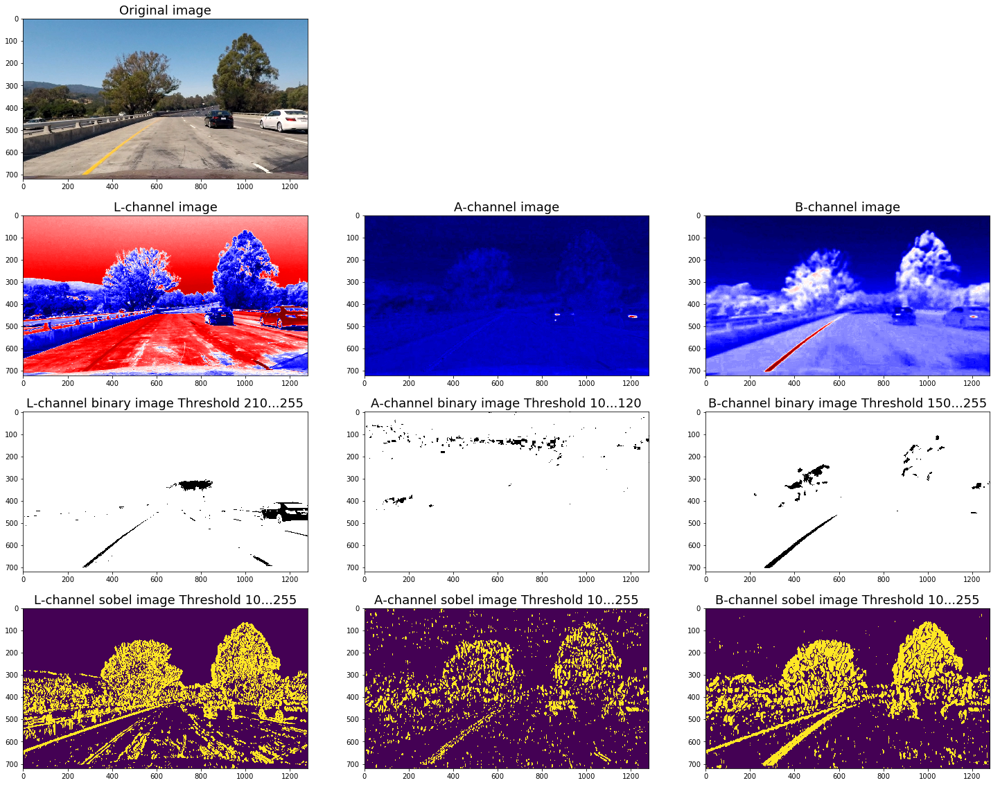

In [11]:
Lthresh = (210,255)             # Threshold for L-Channel
Athresh = (10,120)             # Threshold for A-Channel
Bthresh = (150,255)               # Threshold for B-Channel


lab_binary_imgs = create_LAB_binary_images(udst, Lthresh, Athresh, Bthresh)
lab_img = cv2.cvtColor(udst,cv2.COLOR_RGB2LAB)

f, axc = plt.subplots(4,3,figsize = (25,20))

axc[0,0].imshow(udst)
axc[0,0].set_title('Original image', fontsize=title_font_size)

axc[0,1].set_axis_off()
axc[0,2].set_axis_off()

axc[1,0].imshow(lab_img[:,:,0], cmap = 'seismic')
axc[1,0].set_title('L-channel image', fontsize=title_font_size)

axc[1,1].imshow(lab_img[:,:,1], cmap = 'seismic')
axc[1,1].set_title('A-channel image', fontsize=title_font_size)

axc[1,2].imshow(lab_img[:,:,2], cmap = 'seismic')
axc[1,2].set_title('B-channel image', fontsize=title_font_size)

axc[2,0].imshow(lab_binary_imgs[0], cmap = 'binary')
axc[2,0].set_title('L-channel binary image Threshold '+str(Lthresh[0])+'...'+str(Lthresh[1]), fontsize=title_font_size)

axc[2,1].imshow(lab_binary_imgs[1], cmap = 'binary')
axc[2,1].set_title('A-channel binary image Threshold '+str(Athresh[0])+'...'+str(Athresh[1]), fontsize=title_font_size)

axc[2,2].imshow(lab_binary_imgs[2], cmap = 'binary')
axc[2,2].set_title('B-channel binary image Threshold '+str(Bthresh[0])+'...'+str(Bthresh[1]), fontsize=title_font_size)

axc[3,0].imshow(create_sobel_n_binary_images(lab_img, n=0, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,0].set_title('L-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)

axc[3,1].imshow(create_sobel_n_binary_images(lab_img, n=1, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,1].set_title('A-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)

axc[3,2].imshow(create_sobel_n_binary_images(lab_img, n=2, sobel_kernel=skernel, xthresh=xsobel_thresh))
axc[3,2].set_title('B-channel sobel image Threshold '+str(xsobel_thresh[0])+'...'+str(xsobel_thresh[1]), fontsize=title_font_size)

## Pipeline components and binary image example
Given the images above, a combination of L-channel, S-channel and Y-channel (line 40) is most suitable finding the lanes in the chosen picture. In order to cancel the noise and make sure the lanes are recognized, the x-gradient (and because the lecture suggested) of the channel picture was combined.
During experimenting with other combinations, the gradent was omited, since it seemed to worsen the performance of the final pipeline later on.
To output a binary image, the parameter from the camera-calibration are given to the "binary_image_pipeline" and then shown in a figure as follows.

In [12]:
def binary_image_pipeline(image, ret, mtx, dist):
    # define the threshholds
    xsobel_thresh = (10,255)
    sthresh = (174,250)
    Lthresh = (210,255)
    Bthresh = (150,255)
    ythresh = (200,255)
    hthresh = (10,50)
    
    
    skernel = 15                   # Kernel Size for sobel
    xsobel_thresh = (10,255)        # X Threshold for sobel
    
    # undistort the image
    udst = create_undistort_image(image, ret, mtx, dist)
    
    # suggestion from reviewer, mask yellow and white values within the image
    
    
    # get the S-binary
    hls_binary_imgs = create_HLS_binary_images(udst, hthresh = hthresh, sthresh = sthresh)
    # S-channel
    s_binary = hls_binary_imgs[2]
    h_binary = hls_binary_imgs[0]
    # create the gradient
    hls_img = cv2.cvtColor(udst,cv2.COLOR_RGB2HLS)
    s_x_gradient = create_sobel_n_binary_images(hls_img, n=2, sobel_kernel=skernel, xthresh=xsobel_thresh)

    # get the L-binary
    lab_binary_imgs = create_LAB_binary_images(udst, Lthresh)
    lab_img = cv2.cvtColor(udst,cv2.COLOR_RGB2LAB)
    # L-channel
    l_binary = lab_binary_imgs[0]
    l_x_gradient = create_sobel_n_binary_images(lab_img, n=2, sobel_kernel=skernel, xthresh=xsobel_thresh)

    # Y-channel
    yuv_binary_imgs = create_YUV_binary_images(udst, ythresh = ythresh)
    y_binary = yuv_binary_imgs[0]

    
    # combine everything to create the final binary image
    #combined = np.float32((((l_binary ==1) | (s_binary == 1)) & ((l_x_gradient == 1) | (s_x_gradient == 1))))
    
    # shortcut, reviewer idea for binary images, Cb channel idea from 
    # http://diml.yonsei.ac.kr/papers/Real-time%20Illumination%20Invariant%20Lane%20Detection%20%20for%20Lane%20Departure%20Warning%20System.pdf
    mask1 = select_white_area(udst)
    mask2 = select_yellow_area(udst)
    mask3 = select_yellow_area_cb(udst)
    
    
    #combined = np.float32((((l_binary ==1) | (s_binary == 1) )))
    combined = np.float32((((y_binary ==1) | (mask1)| (mask2) | (mask3))))
    
    #plt.imshow(combined, cmap = 'binary')
    return combined

/home/alex/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


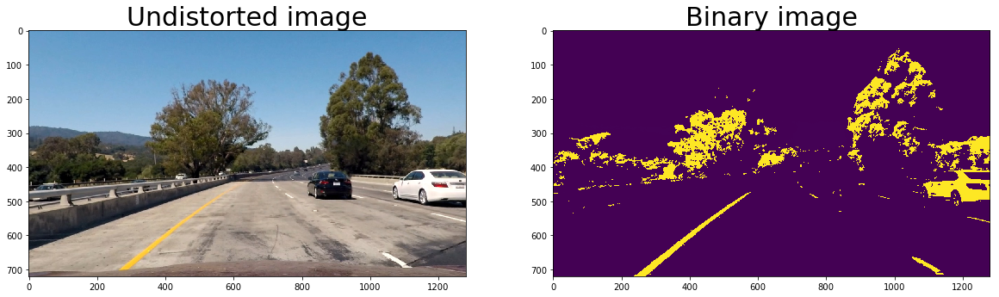

In [13]:
f, ax = plt.subplots(1,2,figsize = (20,20))

ax[0].imshow(udst)
ax[1].imshow(binary_image_pipeline(udst, ret, mtx, dist))
ax[0].set_title('Undistorted image', fontsize=30)
ax[1].set_title('Binary image', fontsize=30)
f.tight_layout
f.show()

## Perspective transform
In order to get a birds-eye-view to calculate the curvature and get a better picture for orientation, the perspective transform was applied. For that purpose opencv provides the "warpPerspective" (line 6) functions which needs the image, a transformation matrix and a output shape in order to work. Opencv has the "getPerspectiveTransform" (line 3) function to calculate the transformation matrix. That function needs a "source", which marks the area that should be transformed, and a "destionation", which marks the target area that it should be transformed to within the picture. In the current case, the "source' and "destination" points are defined for demo purpose in the next codecell lines 16-27

In [14]:
def warp_image(image, source, dest):
    # get the transform matrix
    M = cv2.getPerspectiveTransform(source,dest)

    # warp image
    warped = cv2.warpPerspective(image, M, (image.shape[1],image.shape[0]), flags=cv2.INTER_LINEAR)

    return warped

/home/alex/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


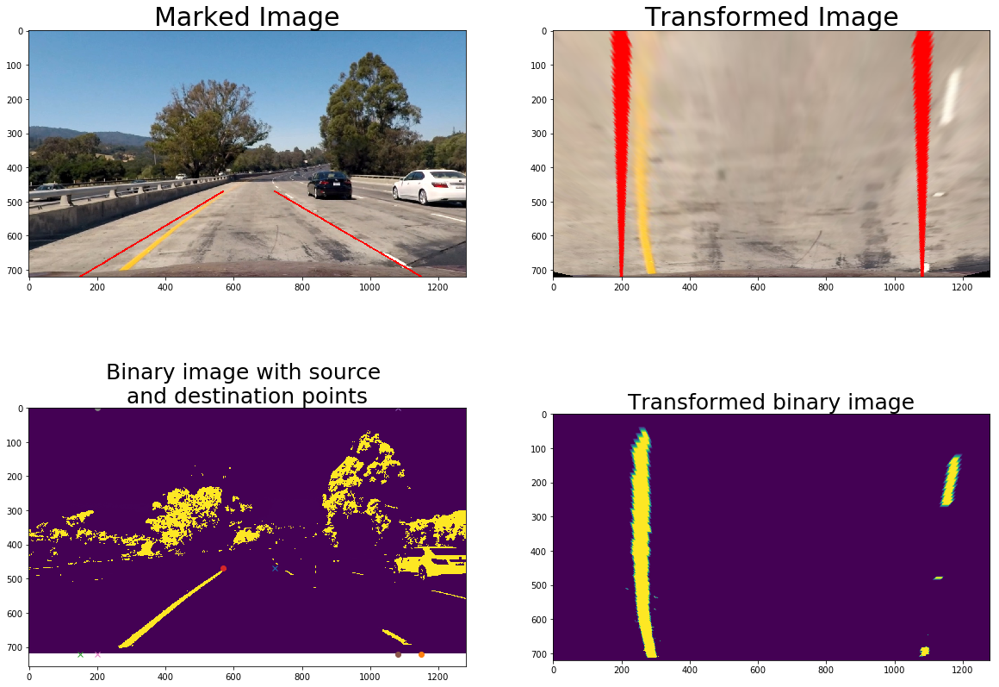

In [15]:
# for demonstration purposes, not part of the pipeline ...

# define center points
centery = 0.5*original_img.shape[0]
width = original_img.shape[1]

# assuming car is in the middle and cut off at 450
bottomx_offset = 80
topx_offset = 550

# define source points
#src_rt = (790,480)
#src_rb = (1200,700)
#src_lb = (230,700)
#src_lt = (520,480)

# define source points - new
src_rt = (720,470)
src_rb = (1150,720)
src_lb = (150,720)
src_lt = (570,470)

#define target points - new
dst_rt = (1080,0)
dst_rb = (1080,720)
dst_lb = (200,720)
dst_lt = (200,0)


# define source points
#src_rt = (790,480)
#src_rb = (1200,720)
#src_lb = (200,720)
#src_lt = (530,480)
src = np.float32([src_rt,src_rb,src_lb,src_lt])

#define target points
#dst_rt = (1200,0)
#dst_rb = (1200,720)
#dst_lb = (80,720)
#dst_lt = (80,0)
dst = np.float32([dst_rt,dst_rb,dst_lb,dst_lt])


udst = create_undistort_image(original_img,ret,mtx,dist)
udst_warped = create_undistort_image(udst,ret,mtx,dist)
sample = create_undistort_image(original_img,ret,mtx,dist)
binary_image = binary_image_pipeline(original_img,ret,mtx,dist)

# draw a line
cv2.line(sample, src_rt, src_rb, (255, 0, 0), 3)
cv2.line(sample, src_lt, src_lb, (255, 0, 0), 3)

warped_marked = warp_image(sample, src, dst)
warped = warp_image(binary_image, src, dst)

out_warped = warped.copy()

f, ax = plt.subplots(2,2,figsize = (20,15))
ax[0,0].imshow(sample)
ax[0,1].imshow(warped_marked)
ax[0,0].set_title('Marked Image', fontsize=30)
ax[0,1].set_title('Transformed Image', fontsize=30)

ax[1,0].imshow(binary_image)
ax[1,0].plot(src_rt[0],src_rt[1],'x')
ax[1,0].plot(src_rb[0],src_rb[1],'o')
ax[1,0].plot(src_lb[0],src_lb[1],'x')
ax[1,0].plot(src_lt[0],src_lt[1],'o')
ax[1,0].plot(dst_rt[0],dst_rt[1],'x')
ax[1,0].plot(dst_rb[0],dst_rb[1],'o')
ax[1,0].plot(dst_lb[0],dst_lb[1],'x')
ax[1,0].plot(dst_lt[0],dst_lt[1],'o')

ax[1,1].imshow(warped)
ax[1,0].set_title('Binary image with source \nand destination points', fontsize=25)
ax[1,1].set_title('Transformed binary image', fontsize=25)

f.tight_layout
f.show()

## Identify lane-line pixels and polynomial fit
To identify the two lane lines, a starting had to be found. For that a histogram of the bottom half warped binary picture was calculated(line 3). Ideally there were two spikes, one for the left and right lane, and the maximum value for each side was calculated(line 6-8). With those two starting points the presented solution in the lecture followed the idea for two rectangles (left/right) which slide from bottom to top and follows a recognized center for each. The new center is based on a threshold value that represents the minimum pixel count to be recognized as a lane(line 29). The width of the rectangles are predefined (line 26) and the height is calculated by the given number of windows (line 11, 14). The loop to find the lane-line pixels (line 40) begins at each center (lines 22,23,44-59) and then tries to find pixels within the current rectangle/window (lines 67-68). In case there are enough pixels the centerpoint of each rectangle is calculated (lines 75-78). The lane pixels are added to a list for each side for later processing and identifieing of the lanes (line 71-72). 
After the loop is finished the line pixels are saved to alist and compared(lines 85-88) to all non-zero points(lines 17-19) of the binary in order to extract these points which most likely represent the lanes.
Those points can now be fitted to a polynomial (2nd order suggested) with numpy function "polyfit" (lines 91-92) which takes the points in y- and x-direction as well es the order. I returns the three values for each coefficient (^2,^1,^0). For demonstration purposes the polonimials with help of the coefficients are drawn onto an output image (lines 94-117).

In [16]:
def first_frame( warped, output_image = False):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(warped[int(warped.shape[0]/2):,:], axis=0)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    
    # Set height of windows
    window_height = np.int(warped.shape[0]/nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 100
    
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    if output_image:    
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((warped, warped, warped))*255

    # Step through the windows one by one
    for window in range(nwindows):
    
        # Identify window boundaries in x and y (and right and left)
        # top
        win_y_low = warped.shape[0] - (window+1)*window_height
    
        # bottom
        win_y_high = warped.shape[0] - window*window_height
    
        # left box, left
        win_xleft_low = leftx_current - margin
    
        # left box, right
        win_xleft_high = leftx_current + margin
    
        # right box, left
        win_xright_low = rightx_current - margin
    
        # left box, right    
        win_xright_high = rightx_current + margin
    
        if output_image:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,128,128), 10) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,128,128), 10)

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
    
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    if lefty.size > 0:
        first_frame.left_fit = np.polyfit(lefty, leftx, 2)
    if righty.size > 0:
        first_frame.right_fit = np.polyfit(righty, rightx, 2)
    
    if output_image:
        # Generate x and y values for plotting
        # f(y) = ay^2 + by + c
        # generate y values
        ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )

        # generate f(y) for the approximated left lane
        left_fitx = first_frame.left_fit[0]*ploty**2 + first_frame.left_fit[1]*ploty + first_frame.left_fit[2]

        # generate f(y) for the approximated right lane
        right_fitx = first_frame.right_fit[0]*ploty**2 + first_frame.right_fit[1]*ploty + first_frame.right_fit[2]
    
        # mask the nonzero points with specific color where they fit the detected lane points
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [128, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 128]

        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='green')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        #plt.figure()
        plt.imshow(out_img)
    
    return first_frame.left_fit, first_frame.right_fit

In [17]:
def generate_lanes(warped, left_fit, right_fit, image = True):
    # Generate x and y values for plotting
    # f(y) = ay^2 + by + c
    # generate y values
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )

    # generate f(y) for the approximated left lane
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]

    # generate f(y) for the approximated right lane
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    if(image):
        # mask the nonzero points with specific color where they fit the detected lane points
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [128, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 128]

        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)

(array([  1.51048644e-04,  -8.56324615e-02,   2.66987300e+02]),
 array([  1.17712650e-04,  -2.56499601e-01,   1.21024231e+03]))

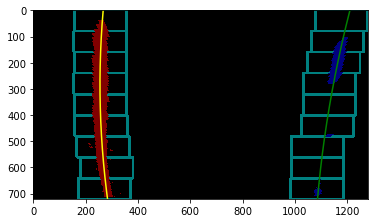

In [18]:
first_frame(warped, True)

In [19]:
def find_lanes(warped, left_fit, right_fit):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]


    # Fit a second order polynomial to each
    if lefty.size > 0:
        find_lanes.left_fit = np.polyfit(lefty, leftx, 2)
    if righty.size > 0:
        find_lanes.right_fit = np.polyfit(righty, rightx, 2)
        
    find_lanes.center_fit = np.mean([find_lanes.left_fit,find_lanes.right_fit], axis=0)

    # Generate x and y values for plotting
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = find_lanes.left_fit[0]*ploty**2 + find_lanes.left_fit[1]*ploty + find_lanes.left_fit[2]
    right_fitx = find_lanes.right_fit[0]*ploty**2 + right_fit[1]*ploty + find_lanes.right_fit[2]
    center_fitx = find_lanes.center_fit[0]*ploty**2 + find_lanes.center_fit[1]*ploty + find_lanes.center_fit[2]
    
    return find_lanes.left_fit, find_lanes.right_fit, left_fitx, right_fitx, center_fitx, ploty

## Calculate lane curvature and vehicle position
The lecture and the provided source http://www.intmath.com/applications-differentiation/8-radius-curvature.php provided explaination and code to realize the calculation very convenient. The defined function "calculate_curvature" takes the fitted polonimials as well as a list of arguments (0-719) as input and follows the agorithm provided in the tutorial. In code the values had to be scaled with a provided factor in order to get real world measurments. The constants are in [m/px] in lines 2-3 for x- and y-directions and are multiplied with the unscaled ponomials (lines 8-9). The calculation follows the formula provided in the tutorial about "Radius of a curvature". Only difference in this application the curve is based oon f(y) and not f(x) as in the tutorial. The "center_fitx" was initially thaught to be more precise and less error prone but didn't work out well.
The vehicle position relative to the center is calculated by assumption that the center of the image is the ideal center of the lane (provided by the lecture tips, line 5). The center_fitx, which is the mean array of left- and right fit, provides the practical or recorded center of the car. Therefore the highest value represents the bottom center point. The difference of both, ideal and recorded, provides with an offset wiith respect to the ideal center. If the offset is negative, the car is left of the center and positive means to the right. Multiplied with the factor for x-direction (line 18) the value is given in [m]

In [20]:
def calculate_curvature(left_fitx, right_fitx, center_fitx, ploty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    camera_center = 1280/2 # assuming that the camera is in the center and represent the optimal center

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    center_fit_cr = np.polyfit(ploty*ym_per_pix, center_fitx*xm_per_pix, 2)

    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*720*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*720*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    center_curverad = ((1 + (2*center_fit_cr[0]*720*ym_per_pix + center_fit_cr[1])**2)**1.5) / np.absolute(2*center_fit_cr[0])
    
    # Calculate the offset from the camera_center
    center_offset = (camera_center - center_fitx[719]) * xm_per_pix # if positive, is more on the right
    
    return left_curverad, right_curverad, center_curverad, center_offset


In [21]:
def draw_lane_text_unwarp(udst, ploty, left_fitx, right_fitx, center_fitx, original_source, original_dest ):
    
    # Create an image to draw the lines on
    color_warp = np.zeros_like(udst).astype(np.uint8)

    # Recast the x and y points into usable format for cv2.fillPoly()
    left_delta = center_fitx[719] - left_fitx[719]
    right_delta = center_fitx[719] - right_fitx[719] 
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = warp_image(color_warp, original_dest, original_source)

    # Combine the result with the original image
    result = cv2.addWeighted(udst, 1, newwarp, 0.3, 0)
    
    # get center points and write on the image/frame
    leftr, rightr, centerr, centero = calculate_curvature(left_fitx, right_fitx, center_fitx, ploty)
    cv2.putText(result, "Left curvature about: "+str(int(leftr))+" m", (50, 40), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 5)
    cv2.putText(result, "Right curvature about: "+str(int(rightr))+" m", (50, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 5)
    cv2.putText(result, "Center curvature about: "+str(int(centerr))+" m", (50, 140), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 5)
    cv2.putText(result, "Center offset about: "+str(int((100.*centero)))+" cm", (50, 190), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 5)
    return result

## Final pipeline
The final image pipeline combines all above described steps. It followes a simple workflow and little error susceptable (no line class and sanity check) but it demonstrates the idea well enough.
The steps are as follow:
* it checks whether or not there has been a camera calibration (lines 4-12)
* undistort the input image (line 15)
* create a binary image (line 18)
* define source and target points for perspective transform (lines 22-33)
* warp/transform the image (line 35)
* find lanes points and calculate polinomial (lines 39-40)
* unwarp the image and draw information the information on the input image
* return result (lines 43-45)


In [22]:
def pipeline(input_image):
    
    # calibrate camera, if not done yet
    if not hasattr(pipeline, "calibrated"):
        # calibrate camera
        pipeline.ret = 0
        pipeline.mtx = 0
        pipeline.dist = 0
        pipeline.rvecs = 0 
        pipeline.tvecs = 0
        pipeline.ret, pipeline.mtx, pipeline.dist, pipeline.rvecs, pipeline.tvecs = calibrate_camera('camera_cal/')
        pipeline.calibrated = True
    
    # undistort image
    udst = create_undistort_image(input_image,pipeline.ret,pipeline.mtx,pipeline.dist)
    
    # create binary image
    binary_image = binary_image_pipeline(udst,pipeline.ret,pipeline.mtx,pipeline.dist)
    
    # warp image
    # define source points - new
    src_rt = (720,470)
    src_rb = (1150,720)
    src_lb = (150,720)
    src_lt = (570,470)

    #define target points - new
    dst_rt = (1080,0)
    dst_rb = (1080,720)
    dst_lb = (200,720)
    dst_lt = (200,0)
    
    # define source points
    #src_rt = (790,480)
    #src_rb = (1200,720)
    #src_lb = (200,720)
    #src_lt = (530,480)
    src = np.float32([src_rt,src_rb,src_lb,src_lt])

    #define target points
    #dst_rt = (1200,0)
    #dst_rb = (1200,720)
    #dst_lb = (80,720)
    #dst_lt = (80,0)
    dst = np.float32([dst_rt,dst_rb,dst_lb,dst_lt])
    
    warped_binary = warp_image(binary_image, src, dst)
    
    #find lanes
    pipeline.left_fit, pipeline.right_fit = first_frame(warped_binary)
    pipeline.initialized = True
        
    pipeline.left_fit, pipeline.right_fit, left_fitx, right_fitx, center_fitx, ploty = find_lanes(warped_binary, pipeline.left_fit, pipeline.right_fit)
    
    # unwarp, draw the lanes and print the information on the image
    result = draw_lane_text_unwarp(udst, ploty, left_fitx, right_fitx, center_fitx, src, dst)
    
    return result
    

## Example image

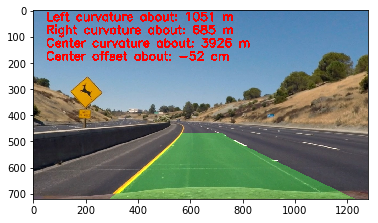

In [23]:
original_image = plt.imread('test_images/test2.jpg')
presult = pipeline(original_image)
plt.imshow(presult)

In [24]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

lane_output = 'lane_found.mp4'
input_clip = VideoFileClip("project_video.mp4")
output_clip = input_clip.fl_image(pipeline)
%time output_clip.write_videofile(lane_output, audio=False)

[MoviePy] >>>> Building video lane_found.mp4
[MoviePy] Writing video lane_found.mp4


100%|█████████▉| 1260/1261 [14:41<00:00,  1.40it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: lane_found.mp4 

CPU times: user 50min 6s, sys: 1min 48s, total: 51min 54s
Wall time: 14min 42s


# Project video

In [25]:
lane_output = 'lane_found.mp4'
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(lane_output))

# Conclusion
The project was very heavy in image processing (which is still surpprising to me) and the possibilities with only process simple video images are impressive. For me I focused a lot finding ways to extract information from color-spaces which might be not as important, since the lecture already gave the solution. It was difficult to find a perfect combination, which took a lot of time, but unfortionately doesn't seem even so important since later the processing with the sliding windows an minimum thresholds can correct a lot. Also the gradient of an image didn't even help as much as I expected. I also had time-trouble (which is my fault) to finish the lane class and sanity checking which leads to some errors at around 14 seconds in the video.
At that part in the video, its good to see where the pipeline has issues. If there is a sudden change in brightness or conntrast or even different levels of it the lane identification fails. There should be some kind f adaptive contrast or brightness correction which ensures the image keeps a certain balance. Moreover some colors can be masked to better "see" them in specific color spaces. Maybe the pixels could be squared or cubed or... to amplify higher values and surpress lower values as a kind of filter. I guess there are some amazing magic filters which balance everything. Also the wheather conditions are going to be a problem (just think of snow). In addition if the dash-dot line is washed away or some crossing lines occure due to construction sites. The problem of lane changing is also not addressed and will make that pipeline fail. Many solution have to be found to make it work.
Finally this project is a great way to understand the basics of image processing for lane finding and discover the many problem a machine has to face in order to figure a simple thing like a lane. It's easy to imagine that just camera images are not enough to make a car safely keep or even change the lanes.